# Instructor Tokenizing Word Embeddings Part 2

Saving plot files is large so the Tokenizing Word Embeddings notebook is split up into two parts for all plots to show. Students should be able to process all of their work in one notebook, however, some plot outputs may be hidden to save space. If this is the case, have the students put  

'''

from IPython.core.interactiveshell 

import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

'''

In the top code chunk of their Jupyter Notebook. 

### Minor Imputation

Because the number of missing values in this dataset is small, we can impute the missing observation with the string "None".

This can be a good way for us to fill those missing values while still reflecting that these values were once empty. 

In [ ]:
#so few null, no need to fix, really
tweet_df.fillna("None", inplace = True)

In [ ]:
tweet_df

### Comparing Similarity 

In the dataset, you can notice that selected text is a selection of texts from the full text Tweets. The sentiment of each Tweet is gathered from the selected text. 

Considering that the selected text should merely be an extraction of key values from the full text, we would expect for the embeddings of both features to overlap. We can examine if this is the case by getting cosine similarity scores of both features and visualizing the output using a dimensionality technique called **t-SNE**. 


In [ ]:
text = tweet_df['text_vec']
sel = tweet_df['select_vec']

In [19]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

tsne = TSNE(perplexity = 40, num_components = 2, verbose=1)
scores_tsne = tsne.fit_transform(scores)
scores_tsne

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 30, Finished, Available)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 27481 samples in 0.242s...
[t-SNE] Computed neighbors for 27481 samples in 216.355s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27481
[t-SNE] Computed conditional probabilities for sample 2000 / 27481
[t-SNE] Computed conditional probabilities for sample 3000 / 27481
[t-SNE] Computed conditional probabilities for sample 4000 / 27481
[t-SNE] Computed conditional probabilities for sample 5000 / 27481
[t-SNE] Computed conditional probabilities for sample 6000 / 27481
[t-SNE] Computed conditional probabilities for sample 7000 / 27481
[t-SNE] Computed conditional probabilities for sample 8000 / 27481
[t-SNE] Computed conditional probabilities for sample 9000 / 27481
[t-SNE] Computed conditional probabilities for sample 10000 / 27481
[t-SNE] Computed conditional probabilities for sample 11000 / 27481
[t-SNE] Computed conditional probabilities for sample 12000 / 27481
[t-SNE] Computed conditional probabilities for s

For Instructor:


Running this model will take a lot of time. There are ways to reduce this time by either running the notebook on a Spark kernel, reducing the size of the embeddings you want to run scores on or running the notebook on a cloud platform with extra compute. Google Colab has a free version that you can run n

In [18]:
scores = util.cos_sim(text, sel)
scores.numpy()

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 29, Finished, Available)

array([[1.        , 0.19935926, 0.31528476, ..., 0.14579976, 0.19676577,
        0.26137375],
       [0.19935926, 1.        , 0.22811195, ..., 0.17897591, 0.07527103,
        0.10557504],
       [0.2509194 , 0.14672342, 0.75624873, ..., 0.16960826, 0.10617312,
        0.04117418],
       ...,
       [0.16034022, 0.26723734, 0.15907555, ..., 0.58574905, 0.44887225,
        0.31779579],
       [0.08438836, 0.03256134, 0.11918525, ..., 0.21207235, 0.45603452,
        0.34154798],
       [0.19392061, 0.27615671, 0.19190573, ..., 0.24442921, 0.24056172,
        0.33664719]])

In [17]:
scores

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 28, Finished, Available)

tensor([[1.0000, 0.1994, 0.3153,  ..., 0.1458, 0.1968, 0.2614],
        [0.1994, 1.0000, 0.2281,  ..., 0.1790, 0.0753, 0.1056],
        [0.2509, 0.1467, 0.7562,  ..., 0.1696, 0.1062, 0.0412],
        ...,
        [0.1603, 0.2672, 0.1591,  ..., 0.5857, 0.4489, 0.3178],
        [0.0844, 0.0326, 0.1192,  ..., 0.2121, 0.4560, 0.3415],
        [0.1939, 0.2762, 0.1919,  ..., 0.2444, 0.2406, 0.3366]],
       dtype=torch.float64)

In [22]:
scores_tsne

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 33, Finished, Available)

array([[ -1.9734067, -24.753191 ,  14.057412 ],
       [ -6.221356 ,  23.761047 , -17.324541 ],
       [  5.769168 , -17.76113  ,   0.5927323],
       ...,
       [-28.40309  ,  18.654968 , -19.406195 ],
       [ -1.9359132, -15.537055 , -33.536194 ],
       [ 39.393555 ,   8.478375 , -18.629889 ]], dtype=float32)

In [25]:
mid = int(len(scores)/2)

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 36, Finished, Available)

StatementMeta(, 42430f31-3fc9-4586-89f5-14f047d8598f, 41, Finished, Available)

invalid value encountered in sqrt


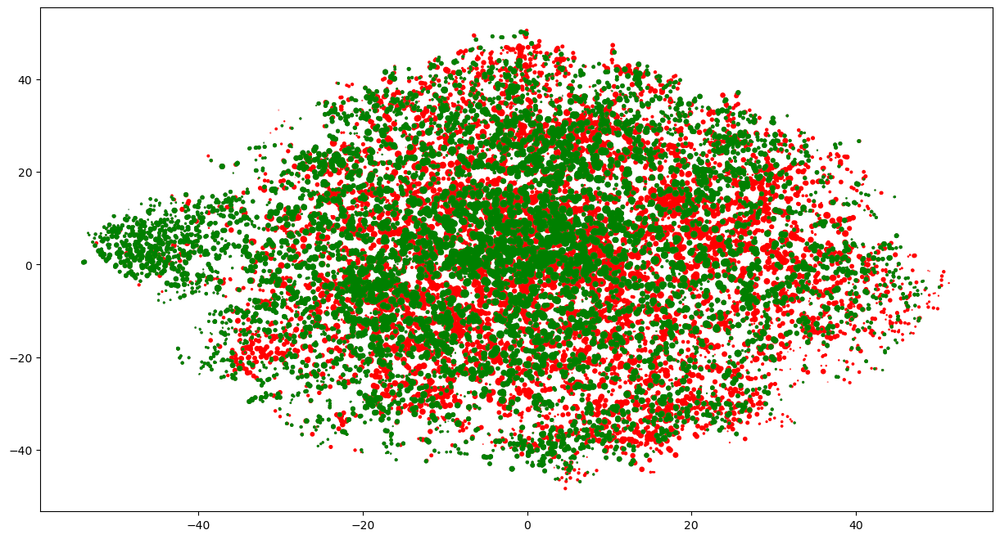

In [30]:
import matplotlib.pyplot as plt

#cmap = plt.cm.get_cmap('Set1')
fig, ax = plt.subplots(figsize=(15,8))
num_categories = 2
ax.scatter(scores_tsne[:,0][0:mid], scores_tsne[:,1][0:mid], scores_tsne[:,2][0:mid], c= 'r')
ax.scatter(scores_tsne[:,0][mid:], scores_tsne[:,1][mid:], scores_tsne[:,2][mid:], c= 'g')

## Let's Think

What does this output show us about the two features, *selected text* and *text*? 

Are they similar to each other according to this plot?

What are some ways that having a feature like *select text* could be beneficial to building models in the future? 

What are some ways that bias can creep in to these types of truncated features?

For Instructor:

This is a significant outcome because it shows that select text is a good proxy. In the case of very large datasets, extacting selected text that is heavily similar to the full text is a great way to reduce training time and overcome size restrictions in Transformer pipelines.

Make sure students explore the ways that extracting text can lead to bias, even if the embeddings appear to overlap enough to be similar. 